In [1]:
# !pip install -qq -U hvplot

## -- Set Device-Agnostic code --
import torch
print(f"ℹ️ Cuda available: {torch.cuda.is_available()}")

if torch.cuda.is_available():
    get_ipython().run_line_magic('load_ext', 'cudf.pandas')
    get_ipython().run_line_magic('load_ext', 'cuml.accel')
else:
    pass

ℹ️ Cuda available: False


In [2]:
## -- IMPORT LIBRARIES --
import sys, os, gc

## -- DATA MANIPUALATION --
import numpy as np, pandas as pd, random

## -- VISUALISATION --
from IPython.display import display, Image
import matplotlib.pyplot as plt
import seaborn as sns
import shap
import hvplot.pandas
# hvplot.extension('matplotlib')

## -- FUNCTIONAL TOOLS --
from time import time, sleep
from tqdm.notebook import tqdm
from itertools import combinations, product

## -- MACHINE LEARNING --
import sklearn
from sklearn.metrics import roc_auc_score, RocCurveDisplay, ConfusionMatrixDisplay
from sklearn.feature_selection import mutual_info_classif
from sklearn.model_selection import StratifiedKFold

# -- GBDTs --
import xgboost as xgb
import lightgbm as lgb
import catboost as cgb

import warnings

In [3]:
print(f"xgboost  version: {xgb.__version__}")
print(f"lightgbm version: {lgb.__version__}")
print(f"catboost version: {cgb.__version__}")

xgboost  version: 3.1.2
lightgbm version: 4.6.0
catboost version: 1.2.8


In [4]:
## -- Global Settings --
sklearn.set_config(transform_output="pandas")
warnings.simplefilter('ignore')
warnings.filterwarnings('ignore')

# pd.options.mode.copy_on_write = True
pd.set_option('display.max_columns', 1000)
plt.style.use("ggplot")
# sns.set_style("whitegrid")
cmap = sns.diverging_palette(0, 230, 90, 60, as_cmap=True)

## -- Set Global Seed --
SEED = 42
np.random.seed(SEED)
random.seed(SEED)

COLOR = '\033[32m'
RESET = '\033[0m'

# from google.colab import data_table
# data_table.enable_dataframe_formatter()

In [5]:
### Load Data ###
PATH = '/kaggle/input/playground-series-s5e12/'
submit = pd.read_csv(PATH+'sample_submission.csv')
train = pd.read_csv(PATH+"train.csv").drop('id', axis=1)
test = pd.read_csv(PATH+"test.csv").drop('id', axis=1)

TARGET = train.columns[-1]
NUMS = test.select_dtypes(include='number').columns.tolist()
CATS = test.select_dtypes(exclude='number').columns.tolist()
BASE = NUMS + CATS

ORIG_PATH = '/kaggle/input/diabetes-health-indicators-dataset/'
orig = pd.read_csv(ORIG_PATH+'diabetes_dataset.csv')

for (name, df) in dict(Train=train, Test=test, Original=orig).items():
    print(f"{name} shape: {df.shape}")

print(f"\nTotal Numerical: {len(NUMS)}")
print(f"Total Categorical: {len(CATS)}")
print(f"Total base features: {len(BASE)}")

Train shape: (700000, 25)
Test shape: (300000, 24)
Original shape: (100000, 31)

Total Numerical: 18
Total Categorical: 6
Total base features: 24


In [6]:
# ## -- Check if id is unique --
# print(f"Train ID column is Unique: {train.id.is_unique}")
# print(f"Test ID column is Unique: {test.id.is_unique}")

In [7]:
display(train.head())
train.info()

,age,alcohol_consumption_per_week,physical_activity_minutes_per_week,diet_score,sleep_hours_per_day,screen_time_hours_per_day,bmi,waist_to_hip_ratio,systolic_bp,diastolic_bp,heart_rate,cholesterol_total,hdl_cholesterol,ldl_cholesterol,triglycerides,gender,ethnicity,education_level,income_level,smoking_status,employment_status,family_history_diabetes,hypertension_history,cardiovascular_history,diagnosed_diabetes
0,31,1,45,7.7,6.8,6.1,33.4,0.93,112,70,62,199,58,114,102,Female,Hispanic,Highschool,Lower-Middle,Current,Employed,0,0,0,1.0
1,50,2,73,5.7,6.5,5.8,23.8,0.83,120,77,71,199,50,121,124,Female,White,Highschool,Upper-Middle,Never,Employed,0,0,0,1.0
2,32,3,158,8.5,7.4,9.1,24.1,0.83,95,89,73,188,59,114,108,Male,Hispanic,Highschool,Lower-Middle,Never,Retired,0,0,0,0.0
3,54,3,77,4.6,7.0,9.2,26.6,0.83,121,69,74,182,54,85,123,Female,White,Highschool,Lower-Middle,Current,Employed,0,1,0,1.0
4,54,1,55,5.7,6.2,5.1,28.8,0.90,108,60,85,206,49,131,124,Male,White,Highschool,Upper-Middle,Never,Retired,0,1,0,1.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 700000 entries, 0 to 699999
Data columns (total 25 columns):
 #   Column                              Non-Null Count   Dtype  
---  ------                              --------------   -----  
 0   age                                 700000 non-null  int64  
 1   alcohol_consumption_per_week        700000 non-null  int64  
 2   physical_activity_minutes_per_week  700000 non-null  int64  
 3   diet_score                          700000 non-null  float64
 4   sleep_hours_per_day                 700000 non-null  float64
 5   screen_time_hours_per_day           700000 non-null  float64
 6   bmi                                 700000 non-null  float64
 7   waist_to_hip_ratio                  700000 non-null  float64
 8   systolic_bp                         700000 non-null  int64  
 9   diastolic_bp                        700000 non-null  int64  
 10  heart_rate                          700000 non-null  int64  
 11  cholesterol_total         

In [8]:
display(test.head())
test.info()

,age,alcohol_consumption_per_week,physical_activity_minutes_per_week,diet_score,sleep_hours_per_day,screen_time_hours_per_day,bmi,waist_to_hip_ratio,systolic_bp,diastolic_bp,heart_rate,cholesterol_total,hdl_cholesterol,ldl_cholesterol,triglycerides,gender,ethnicity,education_level,income_level,smoking_status,employment_status,family_history_diabetes,hypertension_history,cardiovascular_history
0,45,4,100,4.3,6.8,6.2,25.5,0.84,123,70,64,209,55,135,111,Female,White,Highschool,Middle,Former,Employed,0,0,0
1,35,1,87,3.5,4.6,9.0,28.6,0.88,120,74,59,159,47,83,145,Female,White,Highschool,Middle,Never,Unemployed,0,0,0
2,45,1,61,7.6,6.8,7.0,28.5,0.94,112,71,75,173,43,99,184,Male,White,Highschool,Low,Never,Employed,0,0,0
3,55,2,81,7.3,7.3,5.0,26.9,0.91,114,81,61,203,59,116,128,Male,White,Graduate,Middle,Former,Employed,0,0,0
4,77,2,29,7.3,7.6,8.5,22.0,0.83,131,78,79,177,59,87,133,Male,White,Graduate,Low,Current,Unemployed,0,0,0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300000 entries, 0 to 299999
Data columns (total 24 columns):
 #   Column                              Non-Null Count   Dtype  
---  ------                              --------------   -----  
 0   age                                 300000 non-null  int64  
 1   alcohol_consumption_per_week        300000 non-null  int64  
 2   physical_activity_minutes_per_week  300000 non-null  int64  
 3   diet_score                          300000 non-null  float64
 4   sleep_hours_per_day                 300000 non-null  float64
 5   screen_time_hours_per_day           300000 non-null  float64
 6   bmi                                 300000 non-null  float64
 7   waist_to_hip_ratio                  300000 non-null  float64
 8   systolic_bp                         300000 non-null  int64  
 9   diastolic_bp                        300000 non-null  int64  
 10  heart_rate                          300000 non-null  int64  
 11  cholesterol_total         

In [9]:
display(orig.head())
orig.info()

,age,gender,ethnicity,education_level,income_level,employment_status,smoking_status,alcohol_consumption_per_week,physical_activity_minutes_per_week,diet_score,sleep_hours_per_day,screen_time_hours_per_day,family_history_diabetes,hypertension_history,cardiovascular_history,bmi,waist_to_hip_ratio,systolic_bp,diastolic_bp,heart_rate,cholesterol_total,hdl_cholesterol,ldl_cholesterol,triglycerides,glucose_fasting,glucose_postprandial,insulin_level,hba1c,diabetes_risk_score,diabetes_stage,diagnosed_diabetes
0,58,Male,Asian,Highschool,Lower-Middle,Employed,Never,0,215,5.7,7.9,7.9,0,0,0,30.5,0.89,134,78,68,239,41,160,145,136,236,6.36,8.18,29.6,Type 2,1
1,48,Female,White,Highschool,Middle,Employed,Former,1,143,6.7,6.5,8.7,0,0,0,23.1,0.80,129,76,67,116,55,50,30,93,150,2.00,5.63,23.0,No Diabetes,0
2,60,Male,Hispanic,Highschool,Middle,Unemployed,Never,1,57,6.4,10.0,8.1,1,0,0,22.2,0.81,115,73,74,213,66,99,36,118,195,5.07,7.51,44.7,Type 2,1
3,74,Female,Black,Highschool,Low,Retired,Never,0,49,3.4,6.6,5.2,0,0,0,26.8,0.88,120,93,68,171,50,79,140,139,253,5.28,9.03,38.2,Type 2,1
4,46,Male,White,Graduate,Middle,Retired,Never,1,109,7.2,7.4,5.0,0,0,0,21.2,0.78,92,67,67,210,52,125,160,137,184,12.74,7.20,23.5,Type 2,1


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 31 columns):
 #   Column                              Non-Null Count   Dtype  
---  ------                              --------------   -----  
 0   age                                 100000 non-null  int64  
 1   gender                              100000 non-null  object 
 2   ethnicity                           100000 non-null  object 
 3   education_level                     100000 non-null  object 
 4   income_level                        100000 non-null  object 
 5   employment_status                   100000 non-null  object 
 6   smoking_status                      100000 non-null  object 
 7   alcohol_consumption_per_week        100000 non-null  int64  
 8   physical_activity_minutes_per_week  100000 non-null  int64  
 9   diet_score                          100000 non-null  float64
 10  sleep_hours_per_day                 100000 non-null  float64
 11  screen_time_hours_per_day  

In [10]:
train.describe(include='number').T

,count,mean,std,min,25%,50%,75%,max
age,700000.0,50.359734,11.655520,19.00,42.00,50.00,58.00,89.00
alcohol_consumption_per_week,700000.0,2.072411,1.048189,1.00,1.00,2.00,3.00,9.00
physical_activity_minutes_per_week,700000.0,80.230803,51.195071,1.00,49.00,71.00,96.00,747.00
diet_score,700000.0,5.963695,1.463336,0.10,5.00,6.00,7.00,9.90
sleep_hours_per_day,700000.0,7.002200,0.901907,3.10,6.40,7.00,7.60,9.90
screen_time_hours_per_day,700000.0,6.012733,2.022707,0.60,4.60,6.00,7.40,16.50
bmi,700000.0,25.874684,2.860705,15.10,23.90,25.90,27.80,38.40
waist_to_hip_ratio,700000.0,0.858766,0.037980,0.68,0.83,0.86,0.88,1.05
systolic_bp,700000.0,116.294193,11.010390,91.00,108.00,116.00,124.00,163.00
diastolic_bp,700000.0,75.440924,6.825775,51.00,71.00,75.00,80.00,104.00


In [11]:
train.describe(exclude='number').T

,count,unique,top,freq
gender,700000,3,Female,363237
ethnicity,700000,5,White,386153
education_level,700000,4,Highschool,344145
income_level,700000,5,Middle,290557
smoking_status,700000,3,Never,494448
employment_status,700000,4,Employed,516170


In [12]:
# Check if column names are the same regardless of order
are_same_set = set(train.columns) == set(orig.columns)
print(f"Are column names the same regardless of order (train vs orig)? {are_same_set}")

# Check if column names are the same and in the same order
are_same_exact = train.columns.equals(orig.columns)
print(f"Are column names exactly the same and in the same order (train vs orig)? {are_same_exact}")

Are column names the same regardless of order (train vs orig)? False
Are column names exactly the same and in the same order (train vs orig)? False


In [13]:
## -- Unique value counts for each dataset --
TRAIN_UNIQUE = {}
ORIGINAL_UNIQUE = {}
TEST_UNIQUE = {}

for col in BASE:
    TRAIN_UNIQUE[col] = train[col].nunique()
    ORIGINAL_UNIQUE[col] = orig[col].nunique()
    TEST_UNIQUE[col] = test[col].nunique()

unique_counts_df = pd.concat(
        [pd.DataFrame(TRAIN_UNIQUE, index=['Train']),
         pd.DataFrame(ORIGINAL_UNIQUE, index=['Original']),
         pd.DataFrame(TEST_UNIQUE, index=['Test'])],
    )

unique_counts_df.style.background_gradient(cmap='bone')

,age,alcohol_consumption_per_week,physical_activity_minutes_per_week,diet_score,sleep_hours_per_day,screen_time_hours_per_day,bmi,waist_to_hip_ratio,systolic_bp,diastolic_bp,heart_rate,cholesterol_total,hdl_cholesterol,ldl_cholesterol,triglycerides,family_history_diabetes,hypertension_history,cardiovascular_history,gender,ethnicity,education_level,income_level,smoking_status,employment_status
Train,71,9,565,99,69,151,231,36,71,54,60,154,69,151,228,2,2,2,3,5,4,5,3,4
Original,73,11,620,101,71,156,240,40,86,60,64,210,79,190,262,2,2,2,3,5,4,5,3,4
Test,71,9,544,99,68,147,230,37,77,54,60,165,68,165,237,2,2,2,3,5,4,5,3,4


In [14]:
# sns.pairplot(train, hue=TARGET, palette=['r', 'c'], size=3)
# plt.show()

### YDATA-PROFILE REPORT

In [15]:
# # %%capture
# ## -- Comprehensive EDA --
# !{sys.executable} -m pip install -qq -U ydata-profiling[notebook]
# !pip install -qq jupyter-contrib-nbextensions
# !jupyter nbextension enable --py widgetsnbextension

# from ydata_profiling import ProfileReport, compare

# ## -- Single EDA --
# # profile_df = ProfileReport(train, title="Insights into TARGET Types", explorative=True)
# # profile_df.to_notebook_iframe()

# # profile_df.to_file("Loan_EDA_Report.html")

# ## -- Create Profiles for Datasets --
# train_report = ProfileReport(train, title="Train", explorative=True)
# test_report = ProfileReport(test, title="Test", explorative=True)
# orig_report = ProfileReport(orig, title="Original", explorative=True)

# ## -- Compare 2++ Datasets --
# comparison_report = compare([train_report, test_report])

# # ## -- Obtain merged statistics (Don't know its purpose yet)
# # statistics = comparison_report.get_description()
# ## -- Save report to file
# comparison_report.to_file("Loan-Payment | Train-Test_Stats.html")
# comparison_report.to_notebook_iframe()

### EDA

In [16]:
# ## -- Target distribution (Train vs Original) --
# PALETTE = ['c', 'r']
# fix, axs2 = plt.subplots(1, 2, figsize=(20, 5),
#                          gridspec_kw=dict(width_ratios=[0.7, 0.3], wspace=0.1)
#                         )
# # KDEs
# sns.kdeplot(data=train, x=TARGET, color=PALETTE[0], ax=axs2[0], linewidth=2, label='Train')
# sns.kdeplot(data=orig,  x=TARGET, color=PALETTE[1], ax=axs2[0], linewidth=2, label='Original')
# axs2[0].legend()
# axs2[0].grid()
# # BoxplotS
# sns.boxplot(data=[train[TARGET], orig[TARGET]], width=0.6,
#             linewidth=1, fliersize=1, ax=axs2[1], palette=PALETTE)
# axs2[1].set_xticklabels(['Train', 'Original'])
# plt.suptitle("-- Target Distributions --", fontsize=15, fontweight='semibold')
# plt.tight_layout()
# plt.show()

In [17]:
# hvplot.help('bar')

In [18]:
target_train = train[[TARGET]].value_counts()
target_orig = orig[[TARGET]].value_counts()

target_train.hvplot.bar(
    xticks=[0, 1],
    yformatter = f'%1.0f',
    padding=0.5,
    aspect='square',
    label=TARGET+': Train',
).opts(active_tools=["pan"]) + \
            target_orig.hvplot.bar(
                xticks=[0, 1],
                padding=0.5,
                colormap=['c', 'r'],
                aspect='square',
                label=TARGET+': Original',
                shared_axes=False
            ).opts(active_tools=["pan"])

:Layout
   .Bars.Diagnosed_diabetes_colon_Train    :Bars   [diagnosed_diabetes]   (count)
   .Bars.Diagnosed_diabetes_colon_Original :Bars   [diagnosed_diabetes]   (count)

In [19]:
# def distplots_data(
#                     train: pd.DataFrame,
#                     test: pd.DataFrame,
#                     orig: pd.DataFrame,
#                     features: list[str]):

#     # 1) Concatenate data
#     df = pd.concat([
#             train[features].assign(Source='Train'),
#             test[features].assign(Source='Test'),
#             orig[features].assign(Source='Original')
#     ], ignore_index=True)
    
#     PALETTE = ['c', 'r', 'orange']

#     # 2) Create a grid: one row per feature, two columns (KDE vs Boxplot)
#     n_features = len(features)
#     fig, axs = plt.subplots(
#             n_features, 2, figsize=(20, max(5, n_features * 4)),
#             gridspec_kw={'hspace': 0.3, 'wspace': 0.15, 'width_ratios': [0.7, 0.3]})
    
#     # Ensure axs is always 2D for consistent indexing
#     if n_features == 1:
#         axs = axs.reshape(1, 2)
    
#     for i, col in enumerate(features):
#         ax_kde = axs[i, 0]
#         sns.kdeplot(data=df[[col, 'Source']], x=col, hue='Source',
#                     palette=PALETTE, ax=ax_kde, linewidth=2)
#         ax_kde.set(xlabel='', ylabel='')
#         ax_kde.set_title(f"\n{col}")
#         ax_kde.grid()
    
#         ax_box = axs[i, 1]
#         sns.boxplot(data=df, y=col, x='Source', width=0.5, linewidth=1,
#                     fliersize=1, ax=ax_box, palette=PALETTE)
#         ax_box.set_title(f"\n{col}")
#         ax_box.set(xlabel='', ylabel='')
#         ax_box.tick_params(axis='both', which='major')
#         ax_box.set_xticklabels(['Train', 'Test', 'Original'])
    
#     plt.tight_layout()
#     plt.show()

In [20]:
def distplots_data(
                    train: pd.DataFrame,
                    test: pd.DataFrame,
                    orig: pd.DataFrame,
                    features: list[str]):

    for i, col in enumerate(features):
        LABELS = ['Train', 'Test', 'Original']
        distplot = ( 
            train.hvplot.kde(col, label=LABELS[0], width=650, bgcolor='lightgray') * \
            test.hvplot.kde(col, label=LABELS[1]) * \
            orig.hvplot.kde(col, label=LABELS[2])
        ).opts(active_tools=["pan"], title=f"Distribution: {col} across datasets")

        boxplot  = (
            train.hvplot.box(col, invert=True, label=LABELS[0], width=350, bgcolor='lightgray') * \
            test.hvplot.box(col, label=LABELS[1]) * \
            orig.hvplot.box(col, label=LABELS[2])
        ).opts(active_tools=["pan"], show_legend=False)

        display(distplot + boxplot)

In [21]:
distplots_data(train, test, orig, NUMS) # Plot floats

:Layout
   .Overlay.I  :Overlay
      .Distribution.Train    :Distribution   [age]   (Density)
      .Distribution.Test     :Distribution   [age]   (Density)
      .Distribution.Original :Distribution   [age]   (Density)
   .Overlay.II :Overlay
      .BoxWhisker.Train    :BoxWhisker   (age)
      .BoxWhisker.Test     :BoxWhisker   (age)
      .BoxWhisker.Original :BoxWhisker   (age)

:Layout
   .Overlay.I  :Overlay
      .Distribution.Train    :Distribution   [alcohol_consumption_per_week]   (Density)
      .Distribution.Test     :Distribution   [alcohol_consumption_per_week]   (Density)
      .Distribution.Original :Distribution   [alcohol_consumption_per_week]   (Density)
   .Overlay.II :Overlay
      .BoxWhisker.Train    :BoxWhisker   (alcohol_consumption_per_week)
      .BoxWhisker.Test     :BoxWhisker   (alcohol_consumption_per_week)
      .BoxWhisker.Original :BoxWhisker   (alcohol_consumption_per_week)

:Layout
   .Overlay.I  :Overlay
      .Distribution.Train    :Distribution   [physical_activity_minutes_per_week]   (Density)
      .Distribution.Test     :Distribution   [physical_activity_minutes_per_week]   (Density)
      .Distribution.Original :Distribution   [physical_activity_minutes_per_week]   (Density)
   .Overlay.II :Overlay
      .BoxWhisker.Train    :BoxWhisker   (physical_activity_minutes_per_week)
      .BoxWhisker.Test     :BoxWhisker   (physical_activity_minutes_per_week)
      .BoxWhisker.Original :BoxWhisker   (physical_activity_minutes_per_week)

:Layout
   .Overlay.I  :Overlay
      .Distribution.Train    :Distribution   [diet_score]   (Density)
      .Distribution.Test     :Distribution   [diet_score]   (Density)
      .Distribution.Original :Distribution   [diet_score]   (Density)
   .Overlay.II :Overlay
      .BoxWhisker.Train    :BoxWhisker   (diet_score)
      .BoxWhisker.Test     :BoxWhisker   (diet_score)
      .BoxWhisker.Original :BoxWhisker   (diet_score)

:Layout
   .Overlay.I  :Overlay
      .Distribution.Train    :Distribution   [sleep_hours_per_day]   (Density)
      .Distribution.Test     :Distribution   [sleep_hours_per_day]   (Density)
      .Distribution.Original :Distribution   [sleep_hours_per_day]   (Density)
   .Overlay.II :Overlay
      .BoxWhisker.Train    :BoxWhisker   (sleep_hours_per_day)
      .BoxWhisker.Test     :BoxWhisker   (sleep_hours_per_day)
      .BoxWhisker.Original :BoxWhisker   (sleep_hours_per_day)

:Layout
   .Overlay.I  :Overlay
      .Distribution.Train    :Distribution   [screen_time_hours_per_day]   (Density)
      .Distribution.Test     :Distribution   [screen_time_hours_per_day]   (Density)
      .Distribution.Original :Distribution   [screen_time_hours_per_day]   (Density)
   .Overlay.II :Overlay
      .BoxWhisker.Train    :BoxWhisker   (screen_time_hours_per_day)
      .BoxWhisker.Test     :BoxWhisker   (screen_time_hours_per_day)
      .BoxWhisker.Original :BoxWhisker   (screen_time_hours_per_day)

:Layout
   .Overlay.I  :Overlay
      .Distribution.Train    :Distribution   [bmi]   (Density)
      .Distribution.Test     :Distribution   [bmi]   (Density)
      .Distribution.Original :Distribution   [bmi]   (Density)
   .Overlay.II :Overlay
      .BoxWhisker.Train    :BoxWhisker   (bmi)
      .BoxWhisker.Test     :BoxWhisker   (bmi)
      .BoxWhisker.Original :BoxWhisker   (bmi)

:Layout
   .Overlay.I  :Overlay
      .Distribution.Train    :Distribution   [waist_to_hip_ratio]   (Density)
      .Distribution.Test     :Distribution   [waist_to_hip_ratio]   (Density)
      .Distribution.Original :Distribution   [waist_to_hip_ratio]   (Density)
   .Overlay.II :Overlay
      .BoxWhisker.Train    :BoxWhisker   (waist_to_hip_ratio)
      .BoxWhisker.Test     :BoxWhisker   (waist_to_hip_ratio)
      .BoxWhisker.Original :BoxWhisker   (waist_to_hip_ratio)

:Layout
   .Overlay.I  :Overlay
      .Distribution.Train    :Distribution   [systolic_bp]   (Density)
      .Distribution.Test     :Distribution   [systolic_bp]   (Density)
      .Distribution.Original :Distribution   [systolic_bp]   (Density)
   .Overlay.II :Overlay
      .BoxWhisker.Train    :BoxWhisker   (systolic_bp)
      .BoxWhisker.Test     :BoxWhisker   (systolic_bp)
      .BoxWhisker.Original :BoxWhisker   (systolic_bp)

:Layout
   .Overlay.I  :Overlay
      .Distribution.Train    :Distribution   [diastolic_bp]   (Density)
      .Distribution.Test     :Distribution   [diastolic_bp]   (Density)
      .Distribution.Original :Distribution   [diastolic_bp]   (Density)
   .Overlay.II :Overlay
      .BoxWhisker.Train    :BoxWhisker   (diastolic_bp)
      .BoxWhisker.Test     :BoxWhisker   (diastolic_bp)
      .BoxWhisker.Original :BoxWhisker   (diastolic_bp)

:Layout
   .Overlay.I  :Overlay
      .Distribution.Train    :Distribution   [heart_rate]   (Density)
      .Distribution.Test     :Distribution   [heart_rate]   (Density)
      .Distribution.Original :Distribution   [heart_rate]   (Density)
   .Overlay.II :Overlay
      .BoxWhisker.Train    :BoxWhisker   (heart_rate)
      .BoxWhisker.Test     :BoxWhisker   (heart_rate)
      .BoxWhisker.Original :BoxWhisker   (heart_rate)

:Layout
   .Overlay.I  :Overlay
      .Distribution.Train    :Distribution   [cholesterol_total]   (Density)
      .Distribution.Test     :Distribution   [cholesterol_total]   (Density)
      .Distribution.Original :Distribution   [cholesterol_total]   (Density)
   .Overlay.II :Overlay
      .BoxWhisker.Train    :BoxWhisker   (cholesterol_total)
      .BoxWhisker.Test     :BoxWhisker   (cholesterol_total)
      .BoxWhisker.Original :BoxWhisker   (cholesterol_total)

:Layout
   .Overlay.I  :Overlay
      .Distribution.Train    :Distribution   [hdl_cholesterol]   (Density)
      .Distribution.Test     :Distribution   [hdl_cholesterol]   (Density)
      .Distribution.Original :Distribution   [hdl_cholesterol]   (Density)
   .Overlay.II :Overlay
      .BoxWhisker.Train    :BoxWhisker   (hdl_cholesterol)
      .BoxWhisker.Test     :BoxWhisker   (hdl_cholesterol)
      .BoxWhisker.Original :BoxWhisker   (hdl_cholesterol)

:Layout
   .Overlay.I  :Overlay
      .Distribution.Train    :Distribution   [ldl_cholesterol]   (Density)
      .Distribution.Test     :Distribution   [ldl_cholesterol]   (Density)
      .Distribution.Original :Distribution   [ldl_cholesterol]   (Density)
   .Overlay.II :Overlay
      .BoxWhisker.Train    :BoxWhisker   (ldl_cholesterol)
      .BoxWhisker.Test     :BoxWhisker   (ldl_cholesterol)
      .BoxWhisker.Original :BoxWhisker   (ldl_cholesterol)

:Layout
   .Overlay.I  :Overlay
      .Distribution.Train    :Distribution   [triglycerides]   (Density)
      .Distribution.Test     :Distribution   [triglycerides]   (Density)
      .Distribution.Original :Distribution   [triglycerides]   (Density)
   .Overlay.II :Overlay
      .BoxWhisker.Train    :BoxWhisker   (triglycerides)
      .BoxWhisker.Test     :BoxWhisker   (triglycerides)
      .BoxWhisker.Original :BoxWhisker   (triglycerides)

:Layout
   .Overlay.I  :Overlay
      .Distribution.Train    :Distribution   [family_history_diabetes]   (Density)
      .Distribution.Test     :Distribution   [family_history_diabetes]   (Density)
      .Distribution.Original :Distribution   [family_history_diabetes]   (Density)
   .Overlay.II :Overlay
      .BoxWhisker.Train    :BoxWhisker   (family_history_diabetes)
      .BoxWhisker.Test     :BoxWhisker   (family_history_diabetes)
      .BoxWhisker.Original :BoxWhisker   (family_history_diabetes)

:Layout
   .Overlay.I  :Overlay
      .Distribution.Train    :Distribution   [hypertension_history]   (Density)
      .Distribution.Test     :Distribution   [hypertension_history]   (Density)
      .Distribution.Original :Distribution   [hypertension_history]   (Density)
   .Overlay.II :Overlay
      .BoxWhisker.Train    :BoxWhisker   (hypertension_history)
      .BoxWhisker.Test     :BoxWhisker   (hypertension_history)
      .BoxWhisker.Original :BoxWhisker   (hypertension_history)

:Layout
   .Overlay.I  :Overlay
      .Distribution.Train    :Distribution   [cardiovascular_history]   (Density)
      .Distribution.Test     :Distribution   [cardiovascular_history]   (Density)
      .Distribution.Original :Distribution   [cardiovascular_history]   (Density)
   .Overlay.II :Overlay
      .BoxWhisker.Train    :BoxWhisker   (cardiovascular_history)
      .BoxWhisker.Test     :BoxWhisker   (cardiovascular_history)
      .BoxWhisker.Original :BoxWhisker   (cardiovascular_history)

In [22]:
## -- Float Distributions in train --
for i, col in enumerate(NUMS):
    distplot = train.hvplot.hist(col, by=TARGET, bins=80, alpha=0.5, width=650, bgcolor='lightgray')\
                    .opts(active_tools=["pan"], title=f"'{col}' by {TARGET}")
    boxplot  = train.hvplot.box(col, invert=True, by=TARGET, width=350, bgcolor='lightgray')\
                    .opts(active_tools=["pan"])
    display(distplot + boxplot)

:Layout
   .NdOverlay.I  :NdOverlay   [diagnosed_diabetes]
      :Histogram   [age]   (Count)
   .BoxWhisker.I :BoxWhisker   [diagnosed_diabetes]   (age)

:Layout
   .NdOverlay.I  :NdOverlay   [diagnosed_diabetes]
      :Histogram   [alcohol_consumption_per_week]   (Count)
   .BoxWhisker.I :BoxWhisker   [diagnosed_diabetes]   (alcohol_consumption_per_week)

:Layout
   .NdOverlay.I  :NdOverlay   [diagnosed_diabetes]
      :Histogram   [physical_activity_minutes_per_week]   (Count)
   .BoxWhisker.I :BoxWhisker   [diagnosed_diabetes]   (physical_activity_minutes_per_week)

:Layout
   .NdOverlay.I  :NdOverlay   [diagnosed_diabetes]
      :Histogram   [diet_score]   (Count)
   .BoxWhisker.I :BoxWhisker   [diagnosed_diabetes]   (diet_score)

:Layout
   .NdOverlay.I  :NdOverlay   [diagnosed_diabetes]
      :Histogram   [sleep_hours_per_day]   (Count)
   .BoxWhisker.I :BoxWhisker   [diagnosed_diabetes]   (sleep_hours_per_day)

:Layout
   .NdOverlay.I  :NdOverlay   [diagnosed_diabetes]
      :Histogram   [screen_time_hours_per_day]   (Count)
   .BoxWhisker.I :BoxWhisker   [diagnosed_diabetes]   (screen_time_hours_per_day)

:Layout
   .NdOverlay.I  :NdOverlay   [diagnosed_diabetes]
      :Histogram   [bmi]   (Count)
   .BoxWhisker.I :BoxWhisker   [diagnosed_diabetes]   (bmi)

:Layout
   .NdOverlay.I  :NdOverlay   [diagnosed_diabetes]
      :Histogram   [waist_to_hip_ratio]   (Count)
   .BoxWhisker.I :BoxWhisker   [diagnosed_diabetes]   (waist_to_hip_ratio)

:Layout
   .NdOverlay.I  :NdOverlay   [diagnosed_diabetes]
      :Histogram   [systolic_bp]   (Count)
   .BoxWhisker.I :BoxWhisker   [diagnosed_diabetes]   (systolic_bp)

:Layout
   .NdOverlay.I  :NdOverlay   [diagnosed_diabetes]
      :Histogram   [diastolic_bp]   (Count)
   .BoxWhisker.I :BoxWhisker   [diagnosed_diabetes]   (diastolic_bp)

:Layout
   .NdOverlay.I  :NdOverlay   [diagnosed_diabetes]
      :Histogram   [heart_rate]   (Count)
   .BoxWhisker.I :BoxWhisker   [diagnosed_diabetes]   (heart_rate)

:Layout
   .NdOverlay.I  :NdOverlay   [diagnosed_diabetes]
      :Histogram   [cholesterol_total]   (Count)
   .BoxWhisker.I :BoxWhisker   [diagnosed_diabetes]   (cholesterol_total)

:Layout
   .NdOverlay.I  :NdOverlay   [diagnosed_diabetes]
      :Histogram   [hdl_cholesterol]   (Count)
   .BoxWhisker.I :BoxWhisker   [diagnosed_diabetes]   (hdl_cholesterol)

:Layout
   .NdOverlay.I  :NdOverlay   [diagnosed_diabetes]
      :Histogram   [ldl_cholesterol]   (Count)
   .BoxWhisker.I :BoxWhisker   [diagnosed_diabetes]   (ldl_cholesterol)

:Layout
   .NdOverlay.I  :NdOverlay   [diagnosed_diabetes]
      :Histogram   [triglycerides]   (Count)
   .BoxWhisker.I :BoxWhisker   [diagnosed_diabetes]   (triglycerides)

:Layout
   .NdOverlay.I  :NdOverlay   [diagnosed_diabetes]
      :Histogram   [family_history_diabetes]   (Count)
   .BoxWhisker.I :BoxWhisker   [diagnosed_diabetes]   (family_history_diabetes)

:Layout
   .NdOverlay.I  :NdOverlay   [diagnosed_diabetes]
      :Histogram   [hypertension_history]   (Count)
   .BoxWhisker.I :BoxWhisker   [diagnosed_diabetes]   (hypertension_history)

:Layout
   .NdOverlay.I  :NdOverlay   [diagnosed_diabetes]
      :Histogram   [cardiovascular_history]   (Count)
   .BoxWhisker.I :BoxWhisker   [diagnosed_diabetes]   (cardiovascular_history)

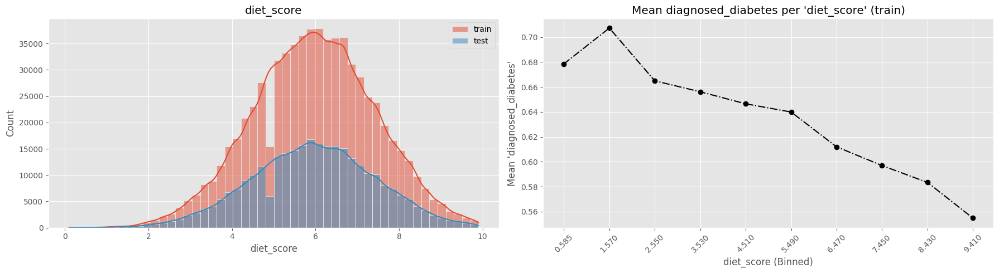

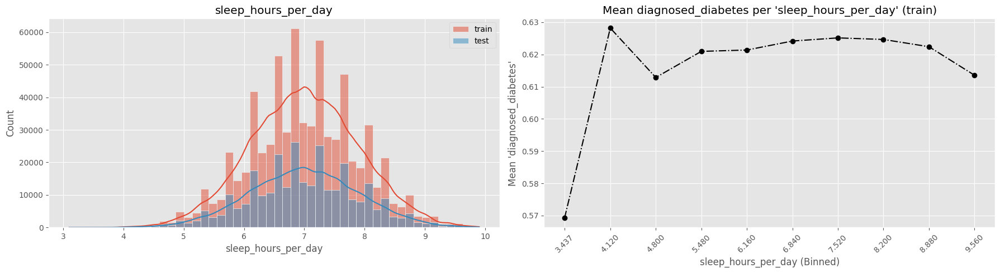

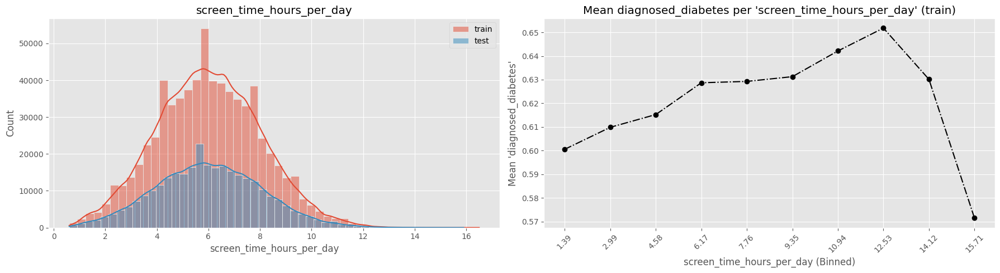

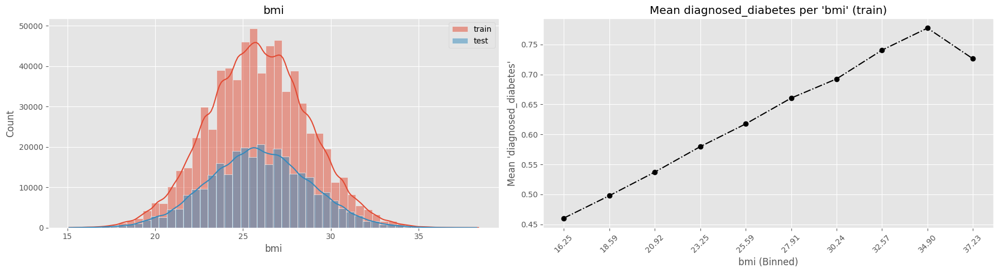

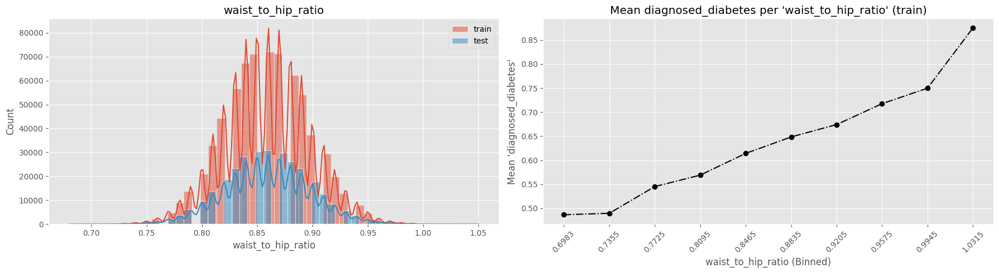

In [23]:
BINS = 10

for c in [c for c in train.columns if train[c].dtype == 'float' and c != TARGET]:
    # PLOT TRAIN DISTRIBUTION COMPARED WITH TEST DISTRIBUTION
    plt.figure(figsize=(18, 5))
    plt.subplot(121)
    sns.histplot(train[c],kde=True,bins=50,label='train',)
    sns.histplot(test[c],kde=True,bins=50,label='test',)
    plt.legend()
    plt.title(f"{c}")
    # PLOT TARGET RELATIONSHIP WITH BINNED BASE
    plt.subplot(122)
    train['bucket'], edges = pd.cut(train[c],bins=BINS,include_lowest=True,retbins=True,labels=False)
    bucket_means = train.groupby('bucket')[TARGET].mean()
    bin_midpoints = (edges[:-1] + edges[1:]) / 2
    plt.plot(bin_midpoints, bucket_means, marker='o',linestyle='-.',color='k')
    plt.xlabel(f'{c} (Binned)')
    plt.ylabel(f"Mean '{TARGET}'")
    plt.title(f"Mean {TARGET} per '{c}' (train)")
    plt.xticks(bin_midpoints, rotation=45)

    plt.tight_layout()
    plt.show()

train.drop(['bucket'], axis=1, inplace=True)

### CATEGORICAL FEATURES

In [24]:
## -- Categorical Features: Counts and Mean by TARGET --
for c in CATS:
    v_counts = train[c].value_counts(dropna=False)
    v_mean = train.groupby(c)[TARGET].value_counts().unstack()
    display(v_counts.hvplot.bar(width=500, yformatter='%1.0f', bgcolor='lightgray')\
                    .opts(active_tools=["pan"], title=f"Counts of '{c}'") + \
            v_mean.hvplot.bar(width=700, yformatter='%1.0f', bgcolor='lightgray')\
                    .opts(active_tools=["pan"], title=f"{TARGET} by '{c}'"))

:Layout
   .Bars.Count :Bars   [gender]   (count)
   .Bars.I     :Bars   [gender,diagnosed_diabetes]   (value)

:Layout
   .Bars.Count :Bars   [ethnicity]   (count)
   .Bars.I     :Bars   [ethnicity,diagnosed_diabetes]   (value)

:Layout
   .Bars.Count :Bars   [education_level]   (count)
   .Bars.I     :Bars   [education_level,diagnosed_diabetes]   (value)

:Layout
   .Bars.Count :Bars   [income_level]   (count)
   .Bars.I     :Bars   [income_level,diagnosed_diabetes]   (value)

:Layout
   .Bars.Count :Bars   [smoking_status]   (count)
   .Bars.I     :Bars   [smoking_status,diagnosed_diabetes]   (value)

:Layout
   .Bars.Count :Bars   [employment_status]   (count)
   .Bars.I     :Bars   [employment_status,diagnosed_diabetes]   (value)

In [25]:
# def plot_heatmap(data, cat_features, name='Data'):
#     df = data.copy()
#     for c in cat_features:
#         df[c] = pd.factorize(df[c])[0]
#     CORR = df.corr('spearman')
#     plt.figure(figsize=(18, 7))
#     sns.heatmap(CORR, mask=np.triu(CORR), annot=True, cbar=False)
#     plt.title(f"Heatmap: {name}", fontsize=12)
#     plt.tight_layout()
#     plt.show()
#     del df

In [26]:
# hvplot.help('heatmap')

In [27]:
def plot_heatmap(data, cat_features, name='Data'):
    df = data.copy()
    for c in cat_features:
        df[c] = pd.factorize(df[c])[0]
    CORR = df.corr('spearman')
    display(CORR.hvplot.heatmap(
        cmap=cmap,
        colorbar=False,
        height=500,
        width=800,
        rot=45,
        # robust=True,
    ).opts(active_tools=["pan"], title=f'{name}: correlation'))
    del df

In [28]:
plot_heatmap(train[BASE+[TARGET]], CATS, 'TRAIN')
plot_heatmap(orig[BASE+[TARGET]],  CATS, 'ORIGINAL')
plot_heatmap(test[BASE], CATS, 'TEST')

:HeatMap   [columns,index]   (value)

:HeatMap   [columns,index]   (value)

:HeatMap   [columns,index]   (value)

In [29]:
display(train.head())
train.info()

,age,alcohol_consumption_per_week,physical_activity_minutes_per_week,diet_score,sleep_hours_per_day,screen_time_hours_per_day,bmi,waist_to_hip_ratio,systolic_bp,diastolic_bp,heart_rate,cholesterol_total,hdl_cholesterol,ldl_cholesterol,triglycerides,gender,ethnicity,education_level,income_level,smoking_status,employment_status,family_history_diabetes,hypertension_history,cardiovascular_history,diagnosed_diabetes
0,31,1,45,7.7,6.8,6.1,33.4,0.93,112,70,62,199,58,114,102,Female,Hispanic,Highschool,Lower-Middle,Current,Employed,0,0,0,1.0
1,50,2,73,5.7,6.5,5.8,23.8,0.83,120,77,71,199,50,121,124,Female,White,Highschool,Upper-Middle,Never,Employed,0,0,0,1.0
2,32,3,158,8.5,7.4,9.1,24.1,0.83,95,89,73,188,59,114,108,Male,Hispanic,Highschool,Lower-Middle,Never,Retired,0,0,0,0.0
3,54,3,77,4.6,7.0,9.2,26.6,0.83,121,69,74,182,54,85,123,Female,White,Highschool,Lower-Middle,Current,Employed,0,1,0,1.0
4,54,1,55,5.7,6.2,5.1,28.8,0.90,108,60,85,206,49,131,124,Male,White,Highschool,Upper-Middle,Never,Retired,0,1,0,1.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 700000 entries, 0 to 699999
Data columns (total 25 columns):
 #   Column                              Non-Null Count   Dtype  
---  ------                              --------------   -----  
 0   age                                 700000 non-null  int64  
 1   alcohol_consumption_per_week        700000 non-null  int64  
 2   physical_activity_minutes_per_week  700000 non-null  int64  
 3   diet_score                          700000 non-null  float64
 4   sleep_hours_per_day                 700000 non-null  float64
 5   screen_time_hours_per_day           700000 non-null  float64
 6   bmi                                 700000 non-null  float64
 7   waist_to_hip_ratio                  700000 non-null  float64
 8   systolic_bp                         700000 non-null  int64  
 9   diastolic_bp                        700000 non-null  int64  
 10  heart_rate                          700000 non-null  int64  
 11  cholesterol_total         

### FEATURE ENGINEERING

In [30]:
ORIG = []

# if 'y' in orig.columns:
#     BASE.append('y')

for col in tqdm(BASE):
    # MEAN
    mean_map = orig.groupby(col)[TARGET].mean()
    mean_col = f"OTE_{col}_mean"
    mean_map.name = mean_col
    
    train = train.merge(mean_map, on=col, how='left')
    test = test.merge(mean_map, on=col, how='left')
    ORIG.append(mean_col)

    # COUNT
    count_col = f"OTE_{col}_count"
    count_map = orig.groupby(col).size().reset_index(name=count_col)
    
    train = train.merge(count_map, on=col, how='left')
    test = test.merge(count_map, on=col, how='left')
    ORIG.append(count_col)

print(len(ORIG), 'Original features merged!!')

  0%|          | 0/24 [00:00<?, ?it/s]

48 Original features merged!!


In [31]:
# ## Fill NaNs with appropriate imputations --
# for c in ORIG:
#     if "MEAN" in c:
#         train[c] = train[c].fillna(orig[TARGET].mean())
#         test[c]  = test[c].fillna(orig[TARGET].mean())
#     elif "COUNT" in c:
#         train[c] = train[c].fillna(orig[c].mode())
#         test[c]  = test[c].fillna(orig[c].mode())
        
# print(f"NaNs present: {train.isna().sum().sum()}")

In [32]:
## -- Factorize using combined data --
for c in CATS:
    combined = pd.concat([train[c], test[c]], ignore_index=True)
    combined = combined.factorize()[0]
    train[c] = combined[:len(train)].astype('int8')
    test[c]  = combined[len(train):].astype('int8')

print(f"✅ Features encoded: {len(CATS)}")
train.shape, test.shape

✅ Features encoded: 6


((700000, 73), (300000, 72))

In [33]:
display(train.head())
train.info()

,age,alcohol_consumption_per_week,physical_activity_minutes_per_week,diet_score,sleep_hours_per_day,screen_time_hours_per_day,bmi,waist_to_hip_ratio,systolic_bp,diastolic_bp,heart_rate,cholesterol_total,hdl_cholesterol,ldl_cholesterol,triglycerides,gender,ethnicity,education_level,income_level,smoking_status,employment_status,family_history_diabetes,hypertension_history,cardiovascular_history,diagnosed_diabetes,OTE_age_mean,OTE_age_count,OTE_alcohol_consumption_per_week_mean,OTE_alcohol_consumption_per_week_count,OTE_physical_activity_minutes_per_week_mean,OTE_physical_activity_minutes_per_week_count,OTE_diet_score_mean,OTE_diet_score_count,OTE_sleep_hours_per_day_mean,OTE_sleep_hours_per_day_count,OTE_screen_time_hours_per_day_mean,OTE_screen_time_hours_per_day_count,OTE_bmi_mean,OTE_bmi_count,OTE_waist_to_hip_ratio_mean,OTE_waist_to_hip_ratio_count,OTE_systolic_bp_mean,OTE_systolic_bp_count,OTE_diastolic_bp_mean,OTE_diastolic_bp_count,OTE_heart_rate_mean,OTE_heart_rate_count,OTE_cholesterol_total_mean,OTE_cholesterol_total_count,OTE_hdl_cholesterol_mean,OTE_hdl_cholesterol_count,OTE_ldl_cholesterol_mean,OTE_ldl_cholesterol_count,OTE_triglycerides_mean,OTE_triglycerides_count,OTE_family_history_diabetes_mean,OTE_family_history_diabetes_count,OTE_hypertension_history_mean,OTE_hypertension_history_count,OTE_cardiovascular_history_mean,OTE_cardiovascular_history_count,OTE_gender_mean,OTE_gender_count,OTE_ethnicity_mean,OTE_ethnicity_count,OTE_education_level_mean,OTE_education_level_count,OTE_income_level_mean,OTE_income_level_count,OTE_smoking_status_mean,OTE_smoking_status_count,OTE_employment_status_mean,OTE_employment_status_count
0,31,1,45,7.7,6.8,6.1,33.4,0.93,112,70,62,199,58,114,102,0,0,0,0,0,0,0,0,0,1.0,0.513622,1248,0.595481,26995,0.625624,601,0.578947,1406,0.597048,3591,0.602357,1612,0.699115,113.0,0.642655,2471,0.593028,2725,0.594722,4017,0.591011,3115,0.612556,1115,0.588970,3681,0.617822,1010,0.576020,809,0.548572,78059,0.592178,74920,0.595699,92080,0.598455,50216,0.593941,20103,0.600677,44891,0.603857,25150,0.600069,20176,0.601512,60175
1,50,2,73,5.7,6.5,5.8,23.8,0.83,120,77,71,199,50,121,124,0,1,0,1,1,0,0,0,0,1.0,0.609855,2476,0.601681,27119,0.643436,617,0.596215,2219,0.607297,3234,0.601562,1664,0.564376,1033.0,0.580003,7331,0.615867,2710,0.585264,4791,0.610901,4770,0.612556,1115,0.618588,3626,0.623711,970,0.589686,892,0.548572,78059,0.592178,74920,0.595699,92080,0.598455,50216,0.601040,44997,0.600677,44891,0.598661,19866,0.599569,59813,0.601512,60175
2,32,3,158,8.5,7.4,9.1,24.1,0.83,95,89,73,188,59,114,108,1,0,0,0,1,1,0,0,0,0.0,0.550671,1342,0.601363,17896,0.526154,325,0.590085,827,0.605560,3453,0.601942,721,0.588469,1006.0,0.580003,7331,0.535519,1098,0.626137,1209,0.594916,4367,0.617694,1266,0.564125,3462,0.617822,1010,0.570175,912,0.548572,78059,0.592178,74920,0.595699,92080,0.600657,47771,0.593941,20103,0.600677,44891,0.603857,25150,0.599569,59813,0.595285,21761
3,54,3,77,4.6,7.0,9.2,26.6,0.83,121,69,74,182,54,85,123,0,1,0,0,0,0,0,1,0,1.0,0.629134,2389,0.601363,17896,0.609272,604,0.620647,1608,0.601288,3727,0.602339,684,0.603448,1044.0,0.580003,7331,0.614118,2550,0.580900,3665,0.613758,4114,0.586957,1242,0.598411,3902,0.596211,1003,0.572893,878,0.548572,78059,0.623285,25080,0.595699,92080,0.598455,50216,0.601040,44997,0.600677,44891,0.603857,25150,0.600069,20176,0.601512,60175
4,54,1,55,5.7,6.2,5.1,28.8,0.90,108,60,85,206,49,131,124,1,1,0,1,1,1,0,1,0,1.0,0.629134,2389,0.595481,26995,0.642857,560,0.596215,2219,0.606158,2793,0.596564,1455,0.643338,743.0,0.633181,5455,0.565734,2358,0.590508,906,0.660440,910,0.636538,1040,0.612337,3534,0.594787,844,0.589686,892,0.548572,78059,0.623285,25080,0.595699,92080,0.600657,47771,0.601040,44997,0.600677,44891,0.598661,19866,0.599569,59813,0.595285,21761


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 700000 entries, 0 to 699999
Data columns (total 73 columns):
 #   Column                                        Non-Null Count   Dtype  
---  ------                                        --------------   -----  
 0   age                                           700000 non-null  int64  
 1   alcohol_consumption_per_week                  700000 non-null  int64  
 2   physical_activity_minutes_per_week            700000 non-null  int64  
 3   diet_score                                    700000 non-null  float64
 4   sleep_hours_per_day                           700000 non-null  float64
 5   screen_time_hours_per_day                     700000 non-null  float64
 6   bmi                                           700000 non-null  float64
 7   waist_to_hip_ratio                            700000 non-null  float64
 8   systolic_bp                                   700000 non-null  int64  
 9   diastolic_bp                                  70

### ML TRAINING

In [34]:
FEATURES = [c for c in train.columns if c != TARGET]
print('Total Features:', len(FEATURES))

Total Features: 72


In [35]:
## -- Define Models --
models = {
    'XGBoost': xgb.XGBClassifier(
        eval_metric = 'auc',
        enable_categorical = True,
        random_state = SEED,
        n_jobs = -1,
        verbosity = 0,
    ),
    'LGBoost': lgb.LGBMClassifier(
        metric = 'auc',
        categorical_feature = CATS,
        random_state = SEED,
        n_jobs = -1,
        verbose = -1,
    ),
    'CATBoost': cgb.CatBoostClassifier(
        eval_metric = 'AUC',
        cat_features = CATS,
        allow_writing_files = False,
        random_state = SEED,
        thread_count = -1,
        verbose = 0,
    ),
}

print(f"Training {len(models)} model:  ", end="")
print(list(models.keys()))

Training 3 model:  ['XGBoost', 'LGBoost', 'CATBoost']


ℹ️ Device: CPU 4 cores


  0%|          | 0/3 [00:00<?, ?it/s]


Training model: XGBoost
	Fold 1 AUC: 0.72654
	Fold 2 AUC: 0.72573
	Fold 3 AUC: 0.72614
	Fold 4 AUC: 0.72706
	Fold 5 AUC: 0.72683
|----------------------------------------------------
| Overall AUC: 0.72645
| Average AUC: 0.72646 ± 0.00048
| Training Time: 1.17 mins


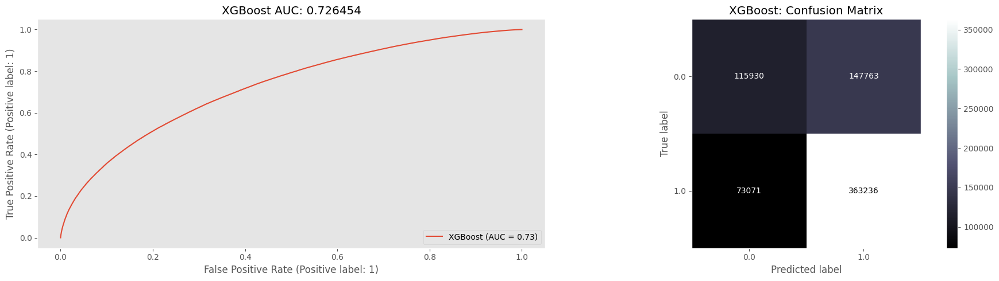


Training model: LGBoost
	Fold 1 AUC: 0.72891
	Fold 2 AUC: 0.72706
	Fold 3 AUC: 0.72780
	Fold 4 AUC: 0.72845
	Fold 5 AUC: 0.72865
|----------------------------------------------------
| Overall AUC: 0.72816
| Average AUC: 0.72817 ± 0.00067
| Training Time: 1.10 mins


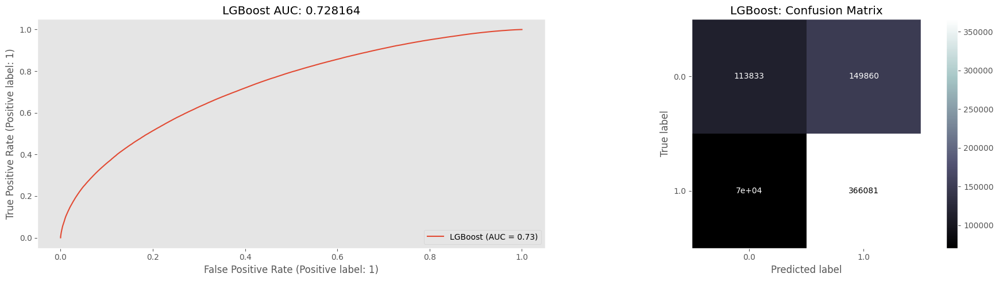


Training model: CATBoost
	Fold 1 AUC: 0.72961
	Fold 2 AUC: 0.72798
	Fold 3 AUC: 0.72913
	Fold 4 AUC: 0.72896
	Fold 5 AUC: 0.72908
|----------------------------------------------------
| Overall AUC: 0.72895
| Average AUC: 0.72895 ± 0.00053
| Training Time: 41.83 mins


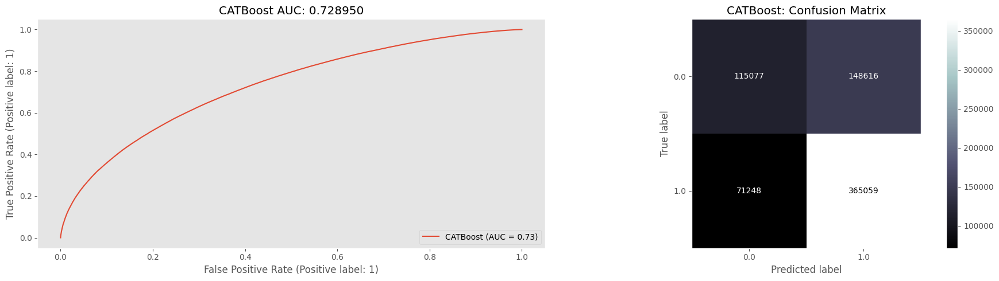

In [36]:
## -- DEFINE TRAINING PARAMETERS --
if torch.cuda.is_available():
    print(f"ℹ️ Device GPU: {torch.cuda.get_device_name(0)}")
    print(f"ℹ️ No. of CPU: {os.cpu_count()} cores")
else:
    print(f"ℹ️ Device: CPU {os.cpu_count()} cores")
## -----------------------------------------------------------------------
## -- Split data --
X = train[FEATURES]
y = train[TARGET]

oof_final = pd.DataFrame()
test_final = pd.DataFrame()

MODELS_FIT = {}
FOLDS      = 5
kf = StratifiedKFold(n_splits=FOLDS, shuffle=True, random_state=SEED)

## -- Initiate Training -- 
## -----------------------------------------------------------------------
for i, (name, model) in tqdm(enumerate(models.items()), total=len(models)):
    print(f"\n{COLOR}Training model: {name}{RESET}")
    
    tik = time()

    oof_preds  = np.zeros(len(X))
    test_preds = np.zeros(len(test))
    fold_scores = []

    for fold, (train_idx, val_idx) in enumerate(kf.split(X, y)):
        X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
        X_test = test[FEATURES].copy()

        X_train[CATS] = X_train[CATS].astype("category")
        X_val[CATS] = X_val[CATS].astype("category")
        X_test[CATS] = X_test[CATS].astype("category")
            
        model.fit(X_train, y_train)
        y_pred = model.predict_proba(X_val)[:, 1]
        oof_preds[val_idx] = y_pred

        predictions = model.predict_proba(X_test)[:, 1]
        test_preds += predictions / FOLDS

        score = roc_auc_score(y_val, y_pred)
        fold_scores.append(score)

        print(f"{COLOR}\tFold {fold+1} AUC: {score:.5f}{RESET}")

    tok = time()
    tiktok = (tok-tik)/60
    
    ## -- After all folds --
    overall_AUC = roc_auc_score(y, oof_preds)
    print(f"|{'-'*52}")
    print(f"| Overall AUC: {overall_AUC:.5f}")
    print(f"| Average AUC: {np.mean(fold_scores):.5f} ± {np.std(fold_scores):.5f}")
    print(f"| Training Time: {tiktok:.2f} mins")
    
    fig, axes = plt.subplots(1, 2, figsize=(18, 5))
    # Left: ROC curve
    RocCurveDisplay.from_predictions(y, oof_preds, name=name, ax=axes[0])
    axes[0].set_title(f"{name} AUC: {overall_AUC:.6f}")
    axes[0].grid(False)
    
    # Right: Confusion matrix (threshold = 0.5)
    pred_labels = (oof_preds >= 0.5).astype(int)
    disp = ConfusionMatrixDisplay.from_predictions(y, pred_labels, cmap='bone', ax=axes[1])
    axes[1].set_title(f"{name}: Confusion Matrix")
    axes[1].grid(False)
    
    plt.tight_layout()
    plt.show()

    oof_final[name]  = oof_preds
    test_final[name] = test_preds
    MODELS_FIT[name] = model

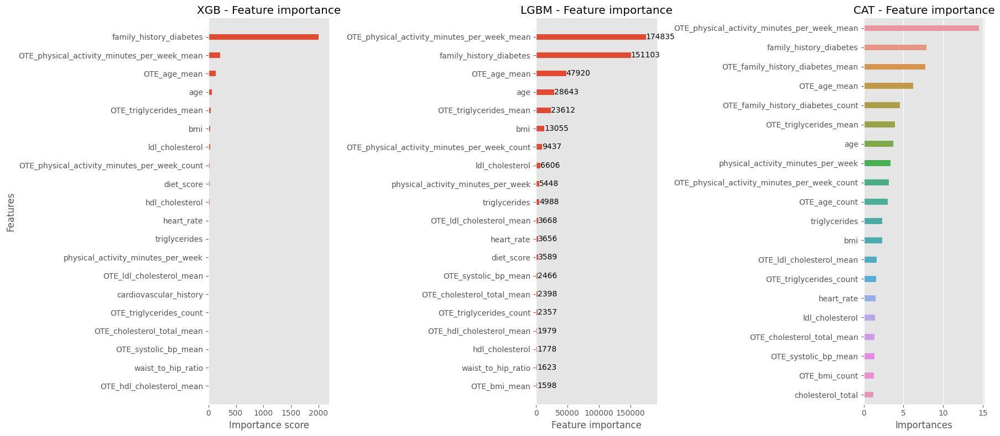

In [37]:
## -- PLOT FEATURES IMPORTANCES -- 
MAX = 20
fig, axs = plt.subplots(1, len(models), figsize=(18, 8))

## -- XGBoost -- 
xgb.plot_importance(
    MODELS_FIT['XGBoost'], importance_type='gain', 
    ax=axs[0], grid=False, height=.3, show_values=False,
    max_num_features=MAX, title="XGB - Feature importance")

## -- LightGBM -- 
lgb.plot_importance(
    MODELS_FIT['LGBoost'], importance_type='gain', 
    ax=axs[1], grid=False, height=.3, precision=0,
    max_num_features=MAX, title="LGBM - Feature importance")
axs[1].set_ylabel("")

## -- CatBoost -- 
cat_imp_df = MODELS_FIT['CATBoost'].get_feature_importance(prettified=True)
sns.barplot(data=cat_imp_df.iloc[:MAX], x='Importances', y='Feature Id', width=.3, ax=axs[2])
axs[2].set_title('CAT - Feature importance')
axs[2].set_ylabel("")

for ax in axs:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
plt.tight_layout()
plt.show() 

In [38]:
# ## -- Plot SHAP values --
# import shap

# MAX = 20
# for i, (name, model) in enumerate(MODELS_FIT.items()):
#     if name in ['XGBoost', 'LGBoost']: 
#         fig, axs = plt.subplots(1, 2, figsize=(20, 12))
#         # Shap Explainer
#         explainer = shap.TreeExplainer(model)
#         explanation = explainer(X_val)
#         # Bar plot 
#         shap.plots.bar(explanation[0], max_display=MAX, ax=axs[0], show=False)
#         axs[0].set_title("SHAP Bar Plot")
#         # Beeswarm plot
#         shap.plots.beeswarm(explanation, max_display=MAX, ax=axs[1], show=False,
#                             order=explanation.abs.max(0), # <-most impactful feature
#                             color_bar=False, plot_size=None,)
#         axs[1].set_title("SHAP Beeswarm Plot") 
#         fig.suptitle(f"- {name}: SHAP Feature Importances -", fontsize=15, fontweight='semibold')
#         fig.tight_layout(pad=1.5) 
#         plt.show()
#         print()

In [39]:
## -- Predictions/OOF of models --
display(oof_final.head())
display(test_final.head())

,XGBoost,LGBoost,CATBoost
0,0.581188,0.503569,0.539394
1,0.640378,0.643259,0.620758
2,0.188015,0.169724,0.163956
3,0.516829,0.495504,0.495527
4,0.781979,0.781497,0.825294


,XGBoost,LGBoost,CATBoost
0,0.448551,0.500176,0.460103
1,0.631107,0.662152,0.692032
2,0.789914,0.765966,0.784089
3,0.368794,0.395115,0.381292
4,0.902461,0.891222,0.937436


### SUBMISSION

In [40]:
## -- Create Submissions for each model --
for c in test_final.columns:
    oof_final[[c]].to_parquet(f"{c}_base_oof.parquet", index=False)
    test_final[[c]].to_parquet(f"{c}_base_pred.parquet", index=False)
    print(f"-> {c} OOF & PREDICTION files saved!")

-> XGBoost OOF & PREDICTION files saved!
-> LGBoost OOF & PREDICTION files saved!
-> CATBoost OOF & PREDICTION files saved!


In [41]:
## -- Create Submissions for each model --
for c in test_final.columns:
    submit[TARGET] = test_final[c].values
    submit.to_csv(f"submit_{c}_base.csv", index=False)
    print(f"-> submit_{c}_base.csv file saved!")

-> submit_XGBoost_base.csv file saved!
-> submit_LGBoost_base.csv file saved!
-> submit_CATBoost_base.csv file saved!
